# Reading Planet Data

Please make sure to use planet_planet.yml file to create the required envrionment for this notebook:

On your terminal make sure you are under the artforestry directory. Then run:

`conda env create -f planet_environment.yml`

Upon succesfull completition of the environment creation. run below command to activate the environment

`conda activate atforestry-planet`

Once the environment is activated, run below command to install the required dependencies:

`pip install -r api_planet/requirements.txt`

Make sure to set your kernel to atforestry_planet

In [7]:
# Import Packages

from telluric.georaster import GeoRaster2
import cv2
import numpy as np
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os

quads_path = os.path.join('..','data','planet_data','quads')



In [3]:
# Define Functions
def preprocess_raster_image(raster):
    # Move channels from start of array (e.g. (C, H, W)) to the end (e.g. (H, W, C))
    image_original = np.einsum('ijk->jki', raster.image)[:, :, :3]

    # Stretch each channel to min/max for later converting the image to np.uint8
    image = image_original.astype(float)
    for idx_channel in range(image.shape[-1]):
        image_min = image[..., idx_channel].min()
        image_max = image[..., idx_channel].max()
        image[..., idx_channel] = (image[..., idx_channel] - image_min) * (255 / (image_max - image_min))

    image = cv2.convertScaleAbs(image)

    return image

def imshow(inp, fig_size=4, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)

    fig, ax = plt.subplots(figsize=(fig_size, fig_size))
    ax.imshow(inp)
    
def transform(image, mean, std):
    for channel in range(3):
        image[:,:,channel] = (image[:,:,channel] - mean[channel]) / std[channel]
    return image

In [8]:
#Read a raster
raster = GeoRaster2.open(os.path.join(quads_path, '364-1203.tiff'))
raster.num_bands, raster.width, raster.height

(5, 4096, 4096)

/tmp/ipykernel_4259/3453074511.py:11: RuntimeWarning: divide by zero encountered in double_scalars
  image[..., idx_channel] = (image[..., idx_channel] - image_min) * (255 / (image_max - image_min))
/tmp/ipykernel_4259/3453074511.py:11: RuntimeWarning: invalid value encountered in multiply
  image[..., idx_channel] = (image[..., idx_channel] - image_min) * (255 / (image_max - image_min))
2022-05-17 06:57:46.065563: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2022-05-17 06:57:46.065944: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/anaconda3/envs/atforestry-planet/lib/python3.9/site-packages/cv2/../../lib64:
2022-05-17 06:57:46.066188: W tensorflow/stream_exec

1


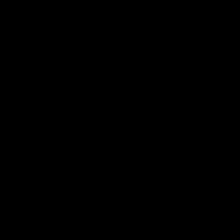

2


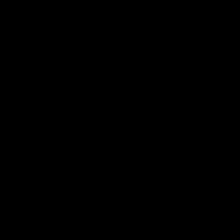

3


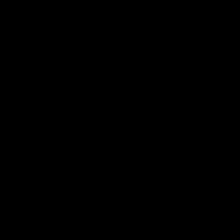

4


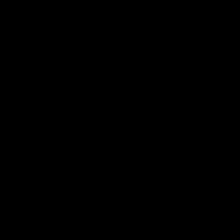

5


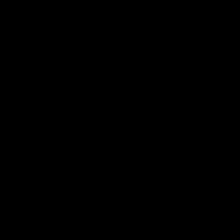

6


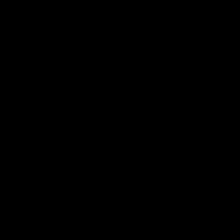

7


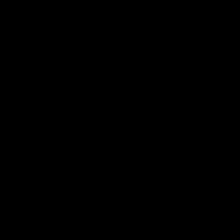

8


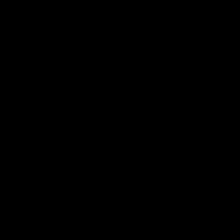

9


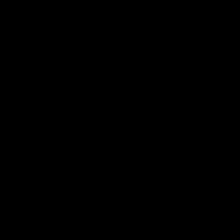

10


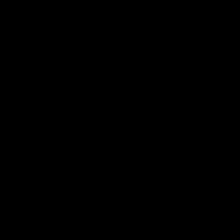

11


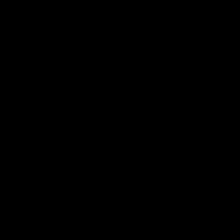

12


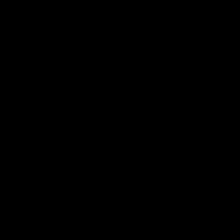

13


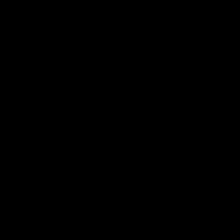

14


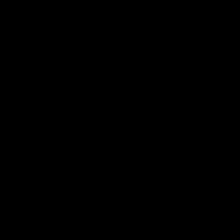

15


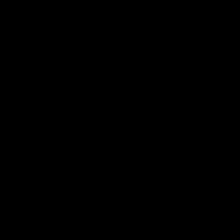

16


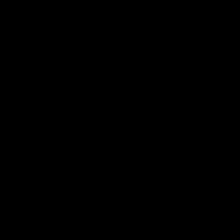

17


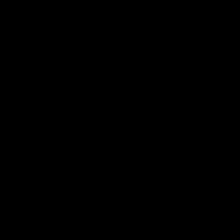

18


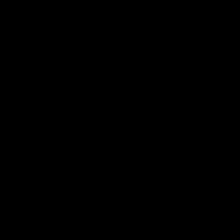

19


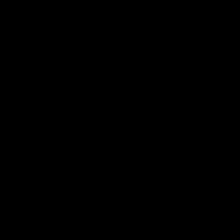

20


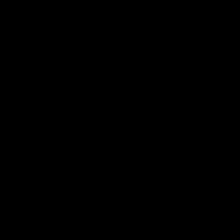

21


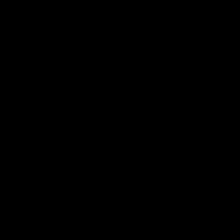

22


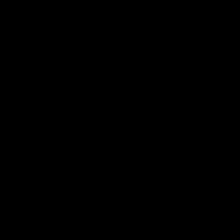

23


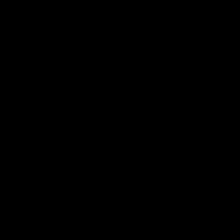

24


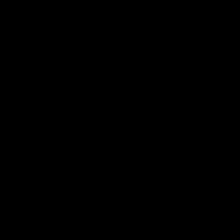

25


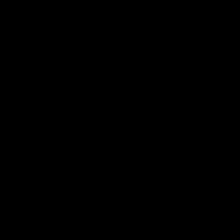

26


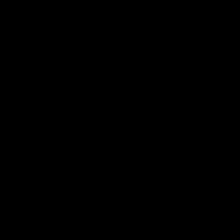

27


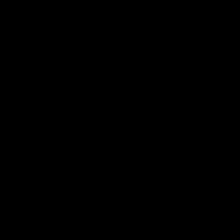

28


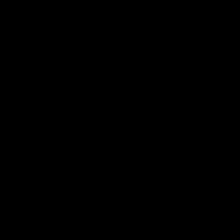

29


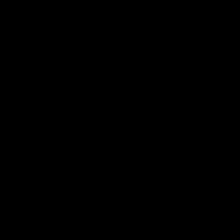

30


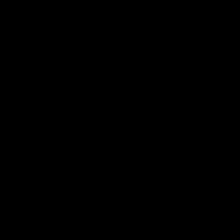

31


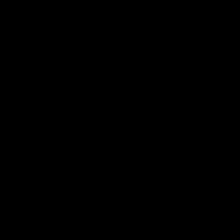

32


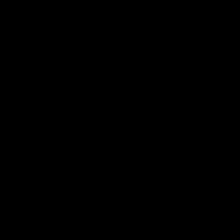

33


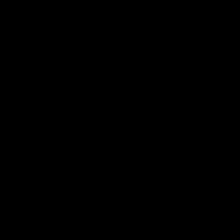

34


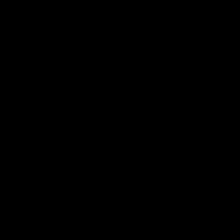

35


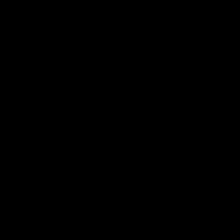

36


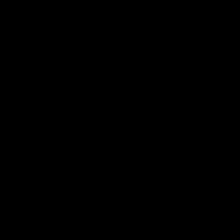

37


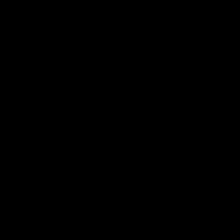

38


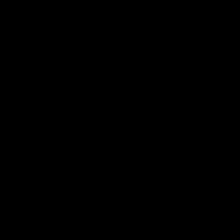

39


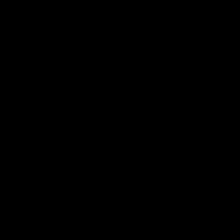

40


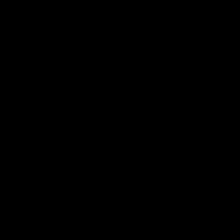

41


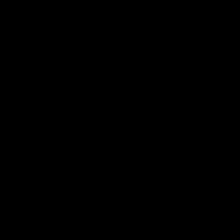

42


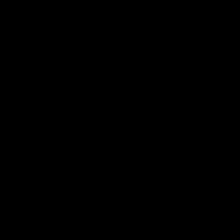

43


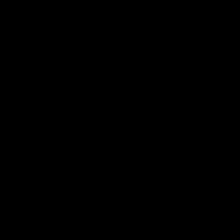

44


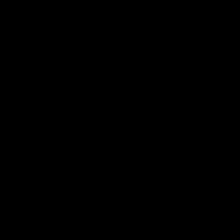

45


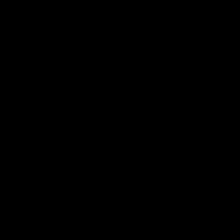

46


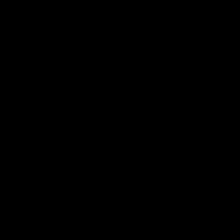

47


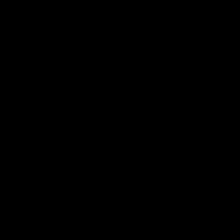

48


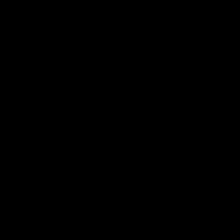

49


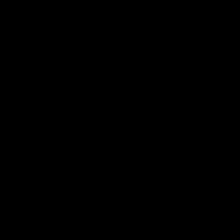

50


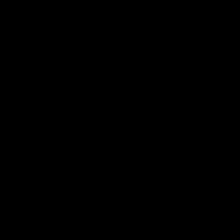

51


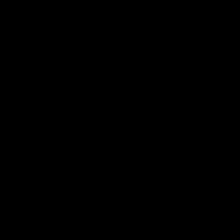

52


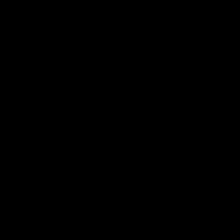

53


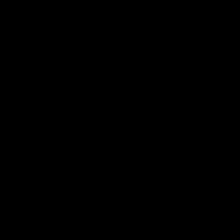

54


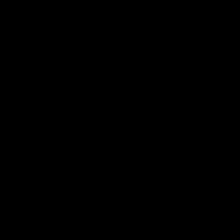

55


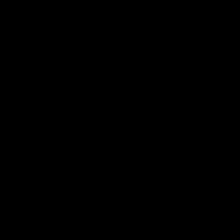

56


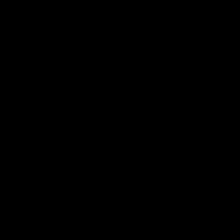

57


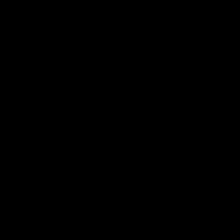

58


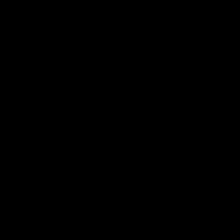

59


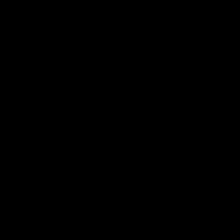

60


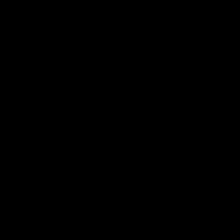

61


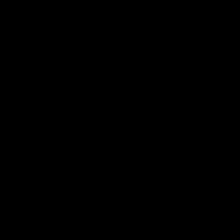

62


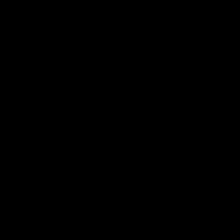

63


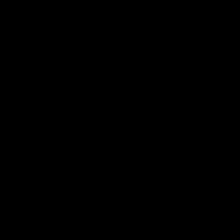

64


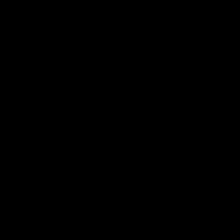

65


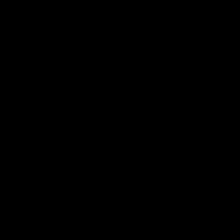

66


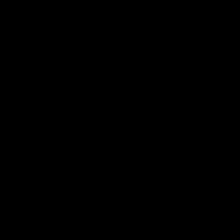

67


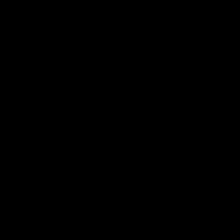

68


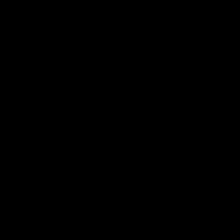

69


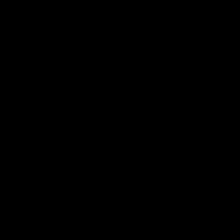

70


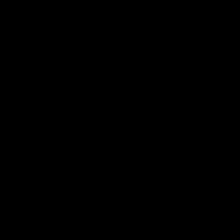

71


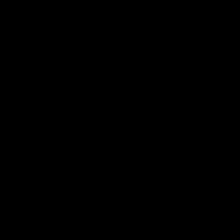

72


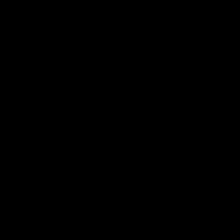

73


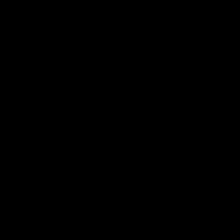

74


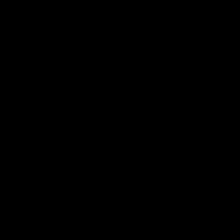

75


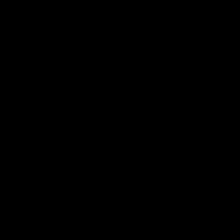

76


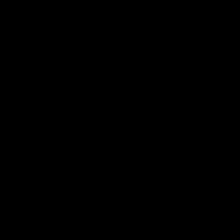

77


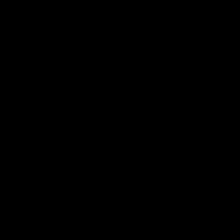

78


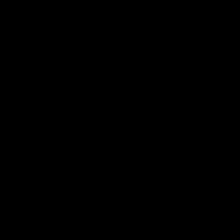

79


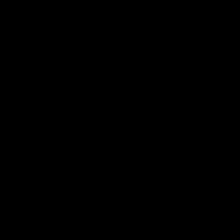

80


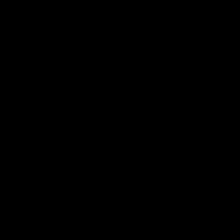

81


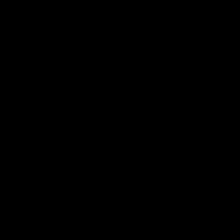

82


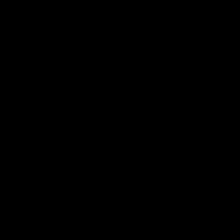

83


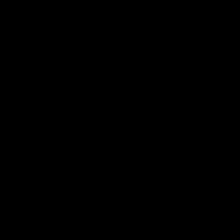

84


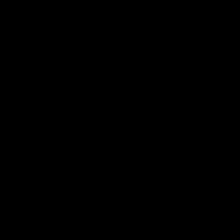

85


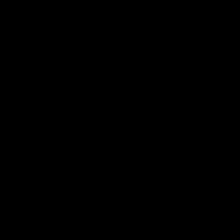

86


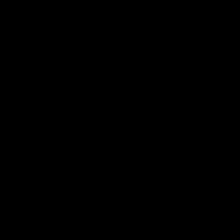

87


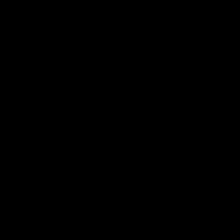

88


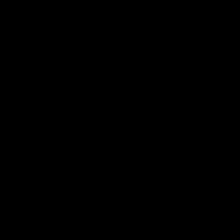

89


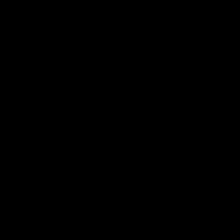

90


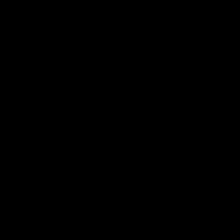

91


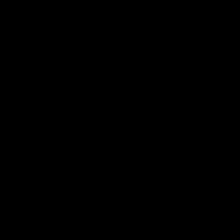

92


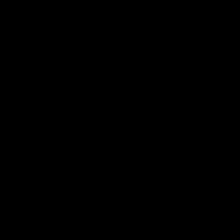

93


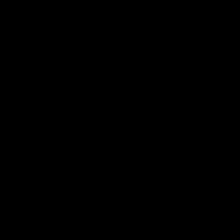

94


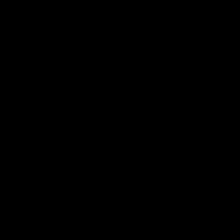

95


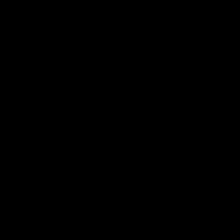

96


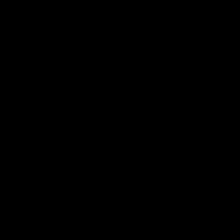

97


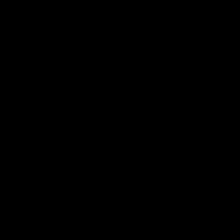

98


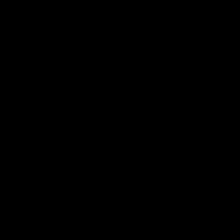

99


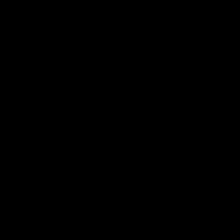

100


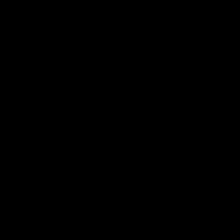

101


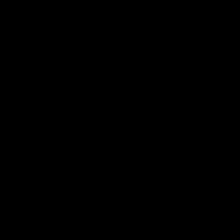

102


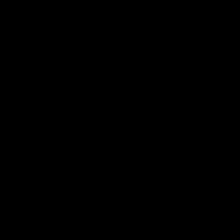

103


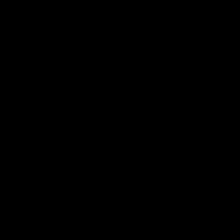

104


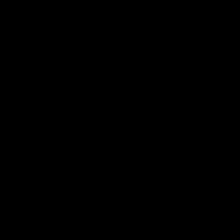

105


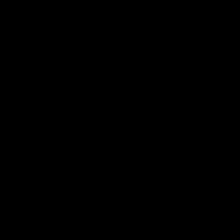

106


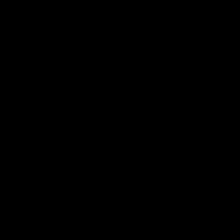

107


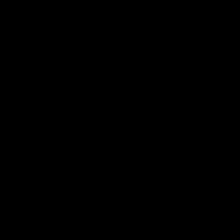

108


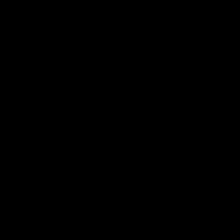

109


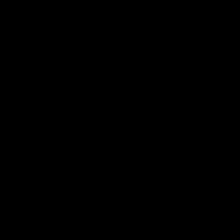

110


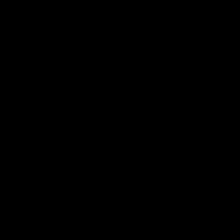

111


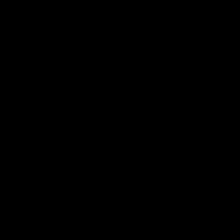

112


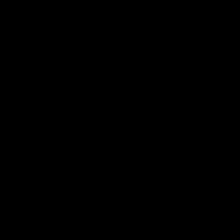

113


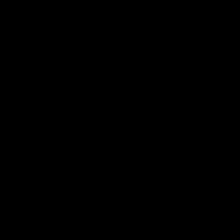

114


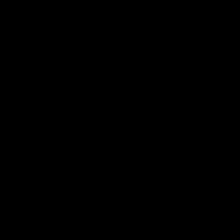

115


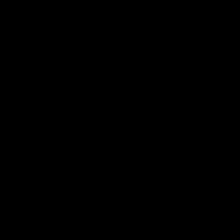

116


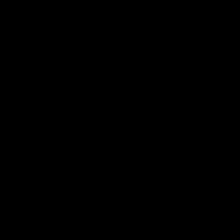

117


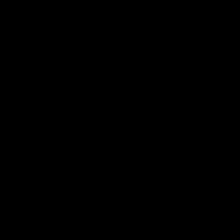

118


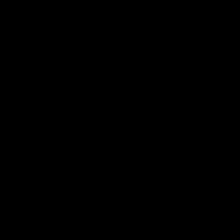

119


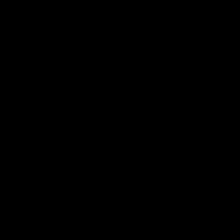

120


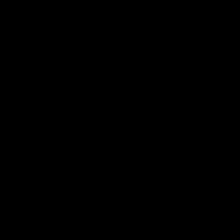

121


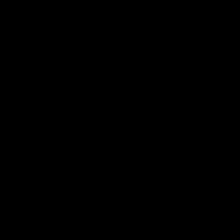

122


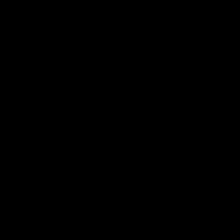

123


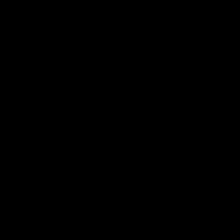

124


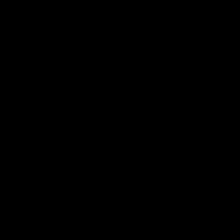

125


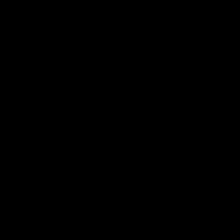

126


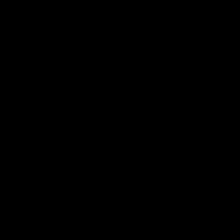

127


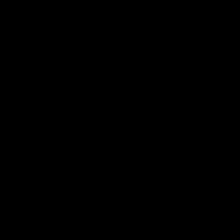

128


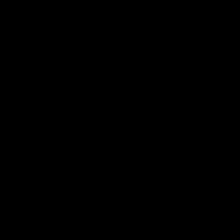

129


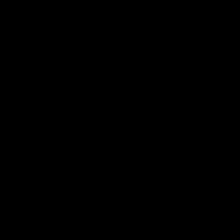

130


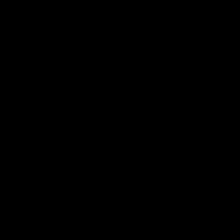

131


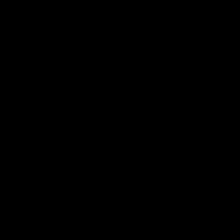

132


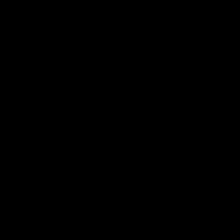

133


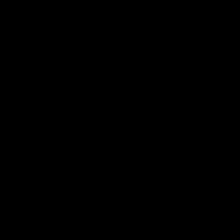

134


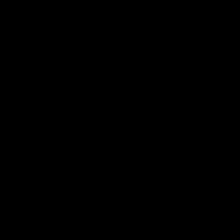

135


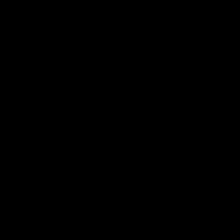

136


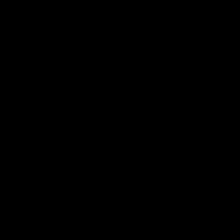

137


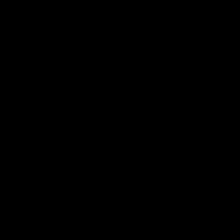

138


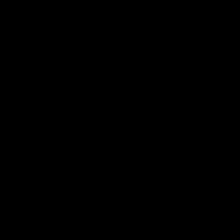

139


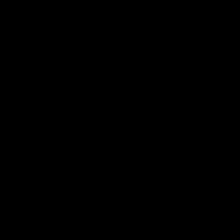

140


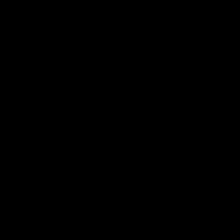

141


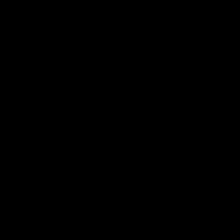

142


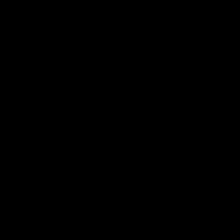

143


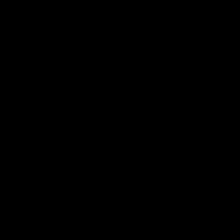

144


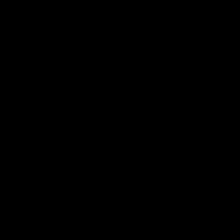

145


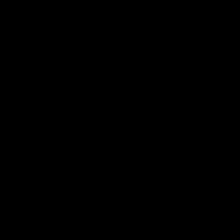

146


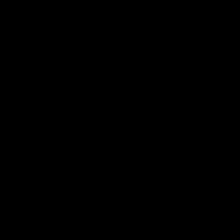

147


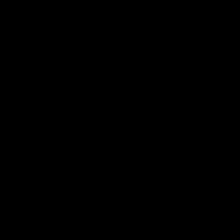

148


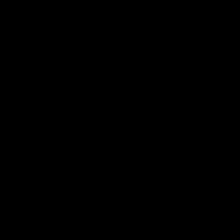

149


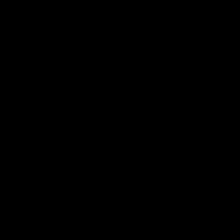

150


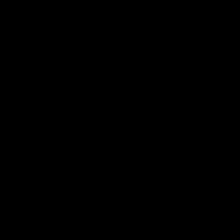

151


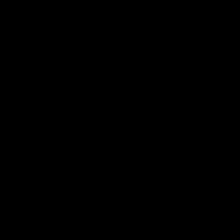

152


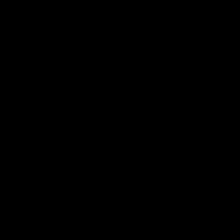

153


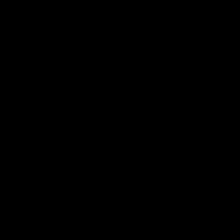

154


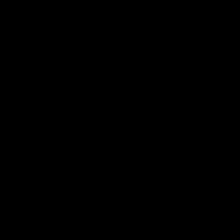

155


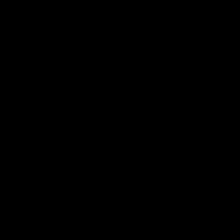

156


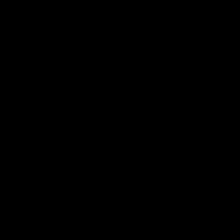

157


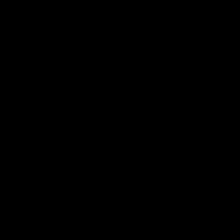

158


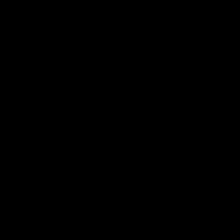

159


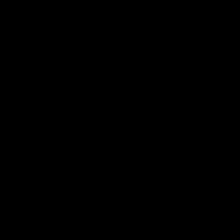

160


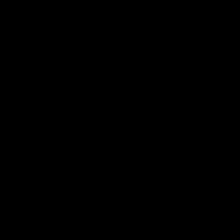

161


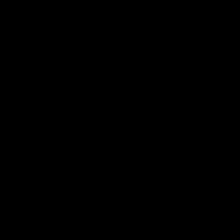

162


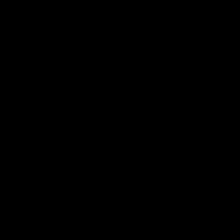

163


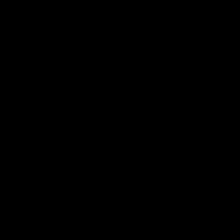

164


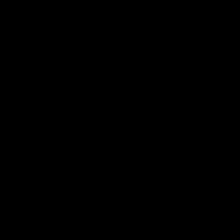

165


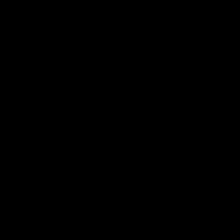

166


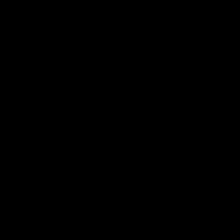

167


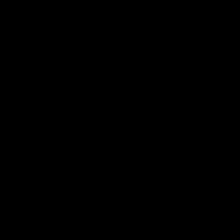

168


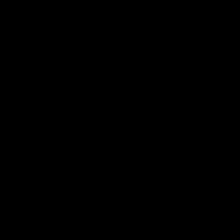

169


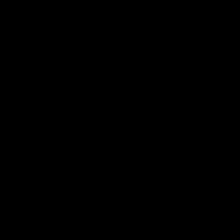

170


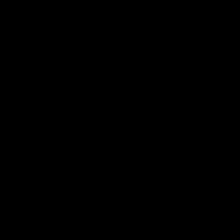

171


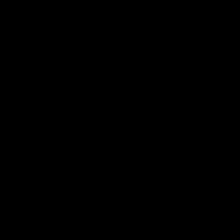

172


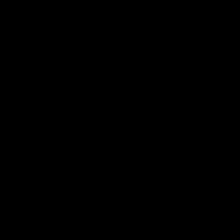

173


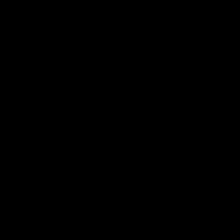

174


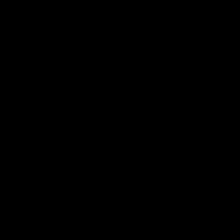

175


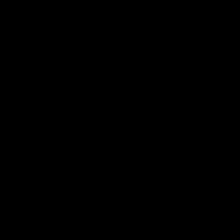

176


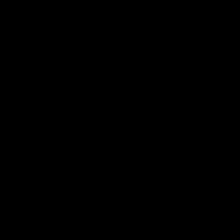

177


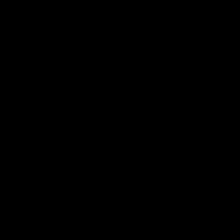

178


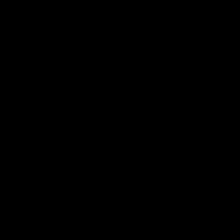

179


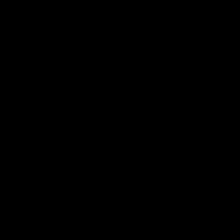

180


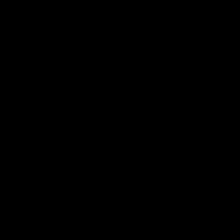

181


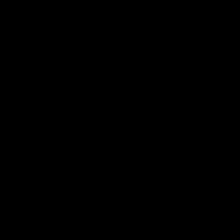

182


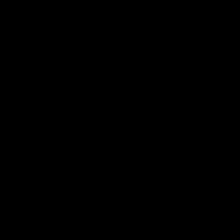

183


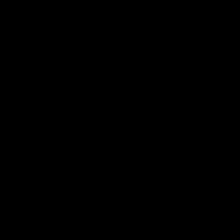

184


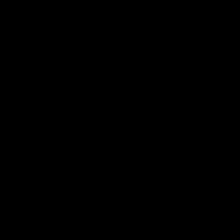

185


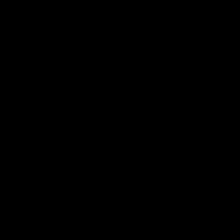

186


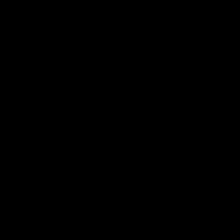

187


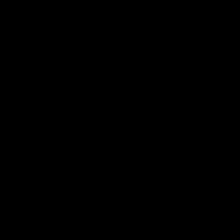

188


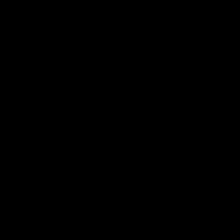

189


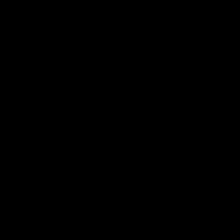

190


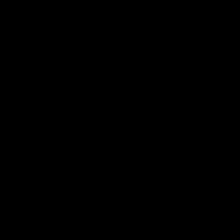

191


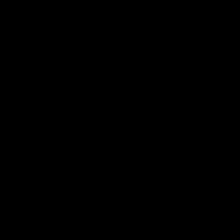

192


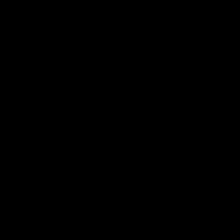

193


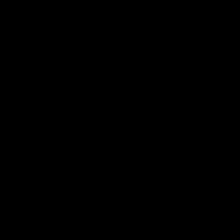

194


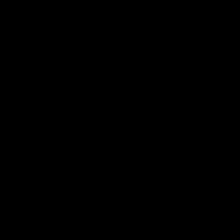

195


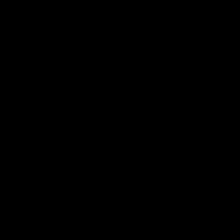

196


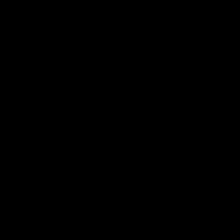

197


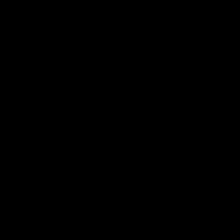

198


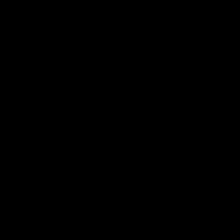

199


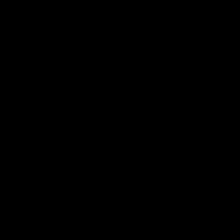

200


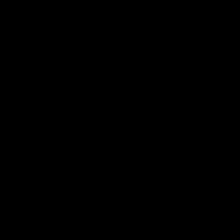

201


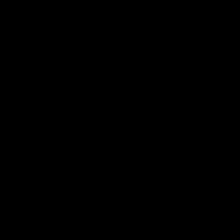

202


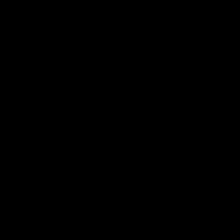

203


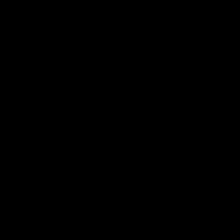

204


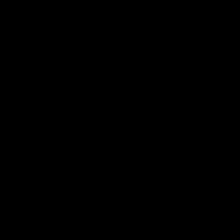

205


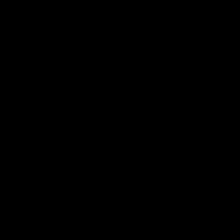

206


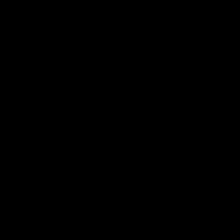

207


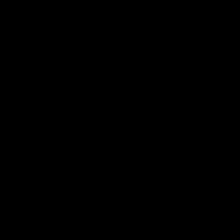

208


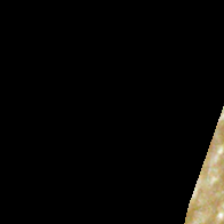

209


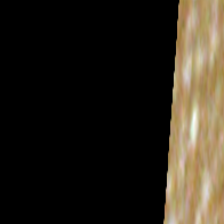

210


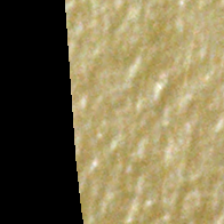

211


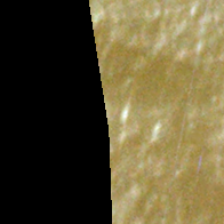

212


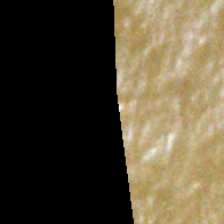

213


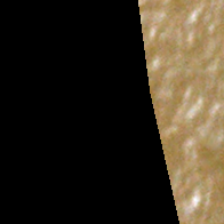

214


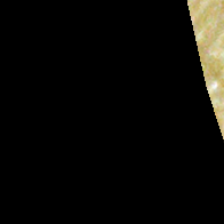

215


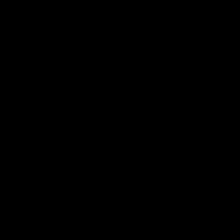

216


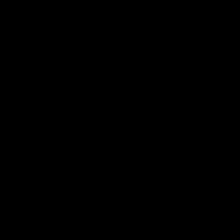

217


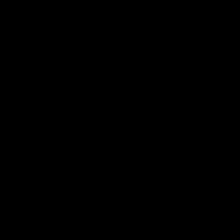

218


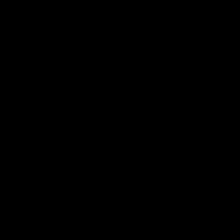

219


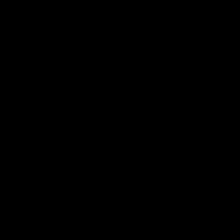

220


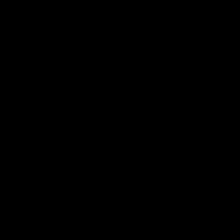

221


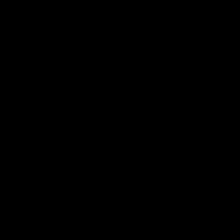

222


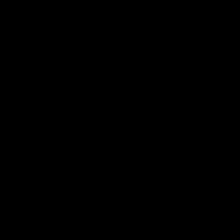

223


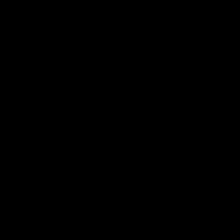

224


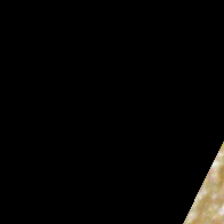

225


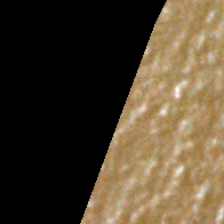

226


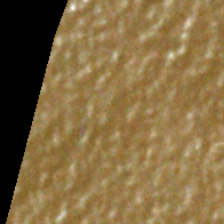

227


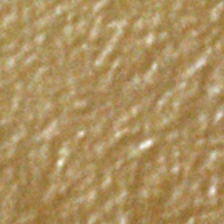

228


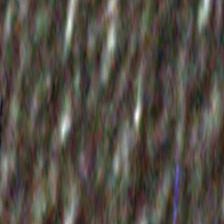

229


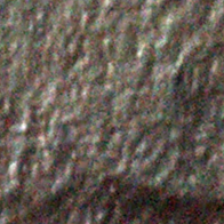

230


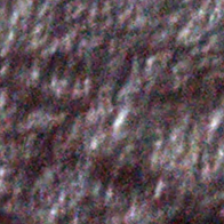

231


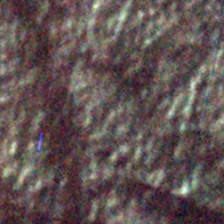

232


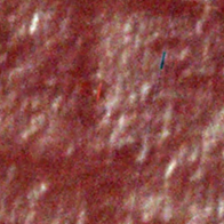

233


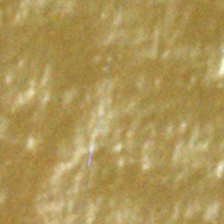

234


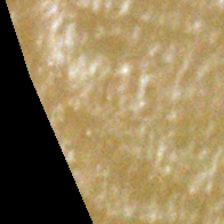

235


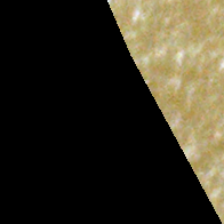

236


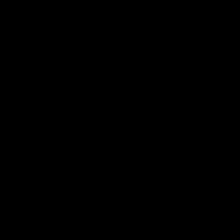

237


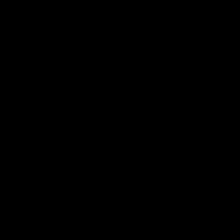

238


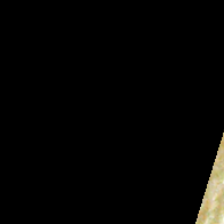

239


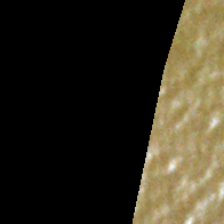

240


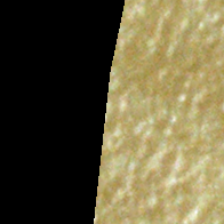

241


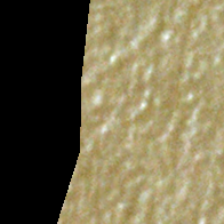

242


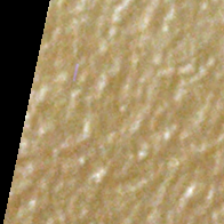

243


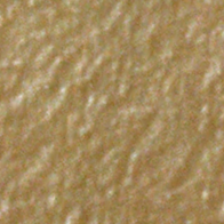

244


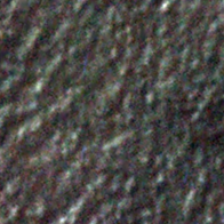

245


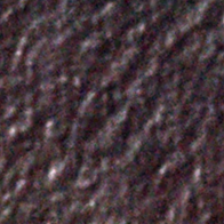

246


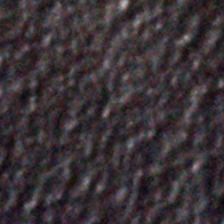

247


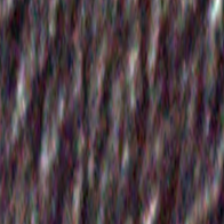

248


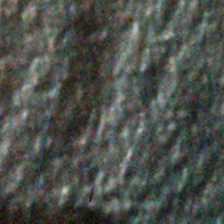

249


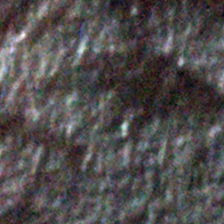

250


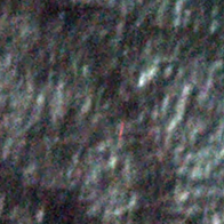

251


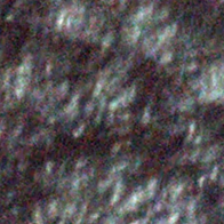

252


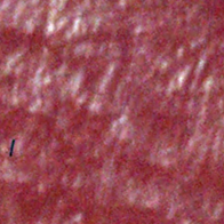

253


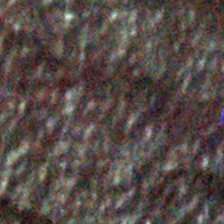

254


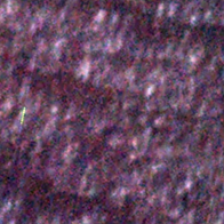

255


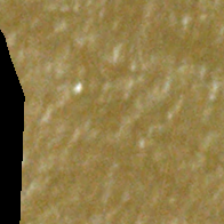

256


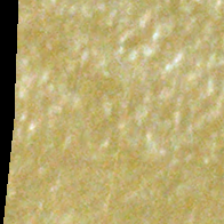

257


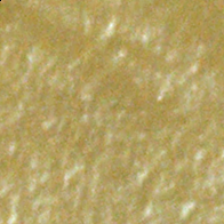

258


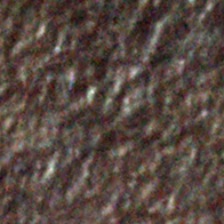

259


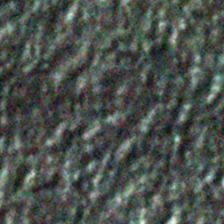

260


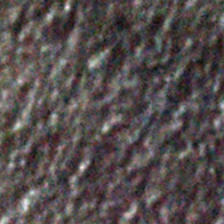

261


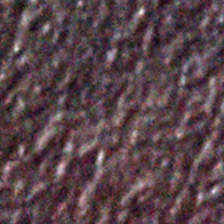

262


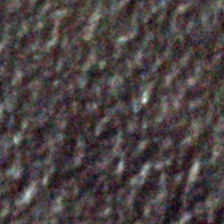

263


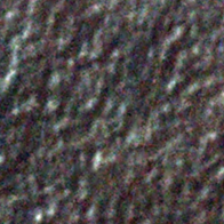

264


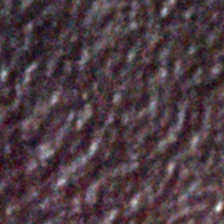

265


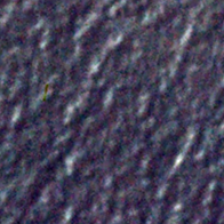

266


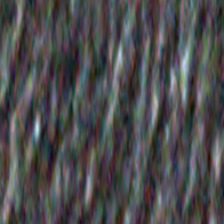

267


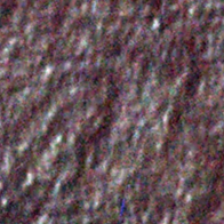

268


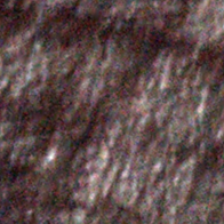

269


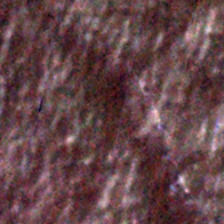

270


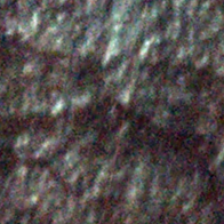

271


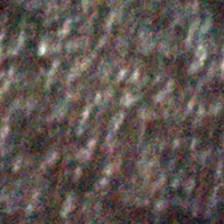

272


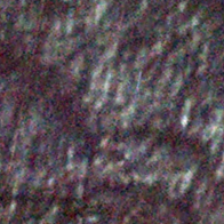

273


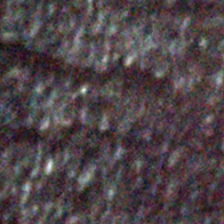

274


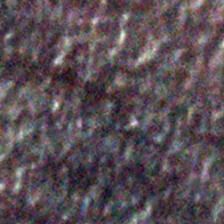

275


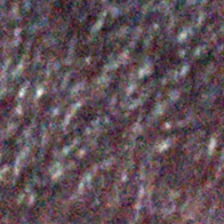

276


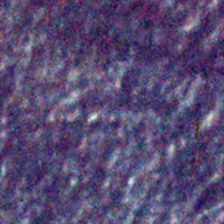

277


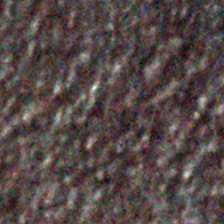

278


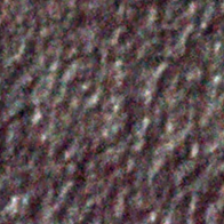

279


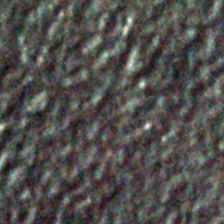

280


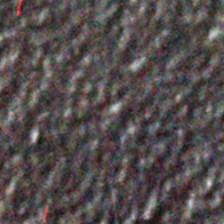

281


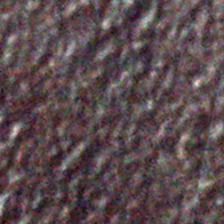

282


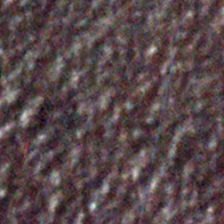

283


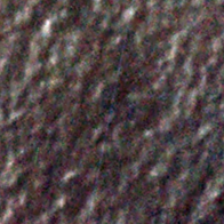

284


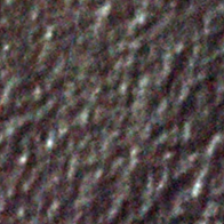

285


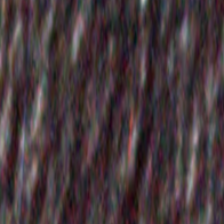

286


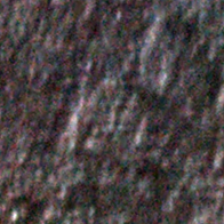

287


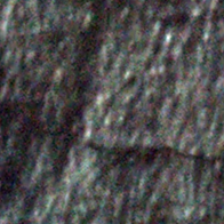

288


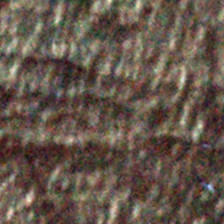

289


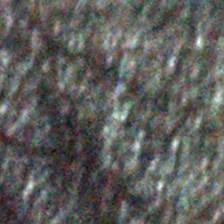

290


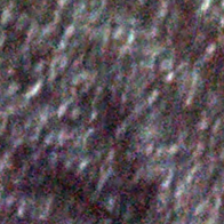

291


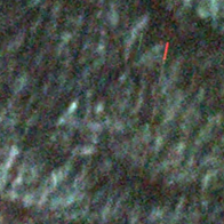

292


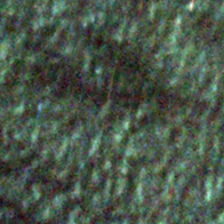

293


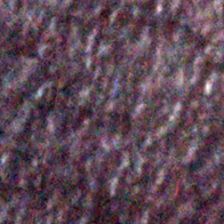

294


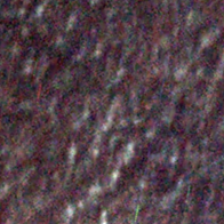

295


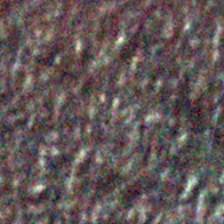

296


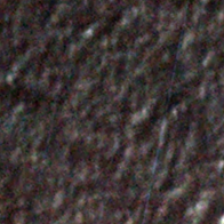

297


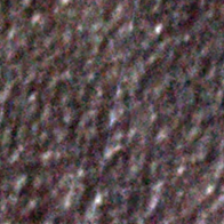

298


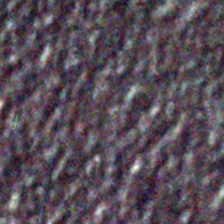

299


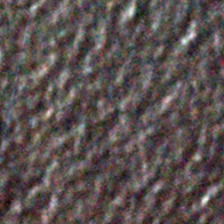

300


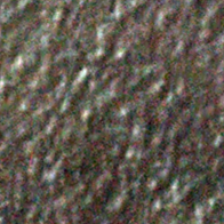

301


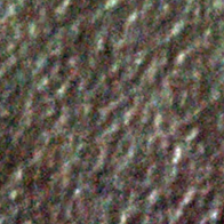

302


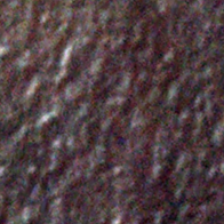

303


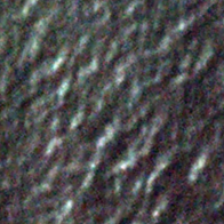

304


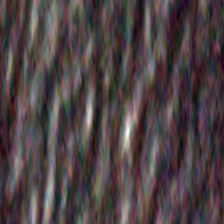

305


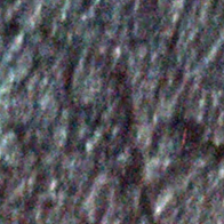

306


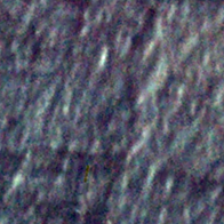

307


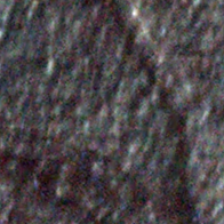

308


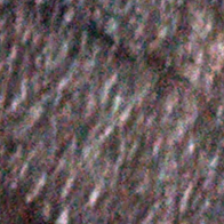

309


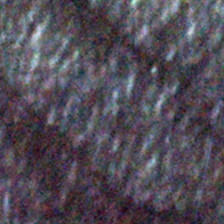

310


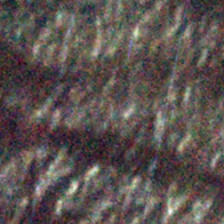

311


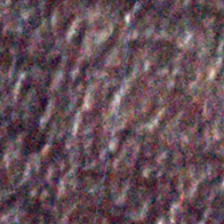

312


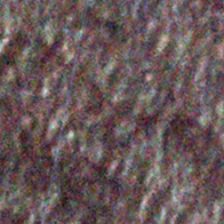

313


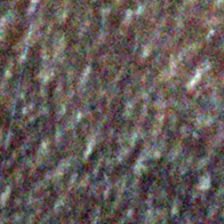

314


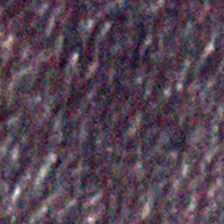

315


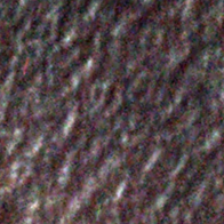

316


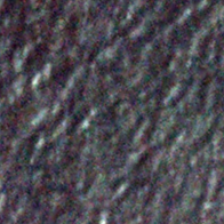

317


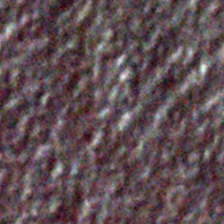

318


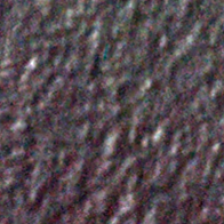

319


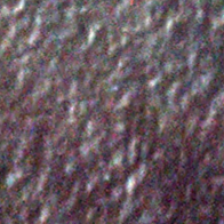

320


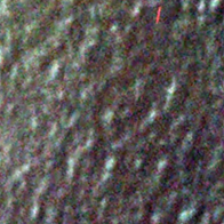

321


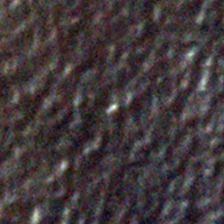

322


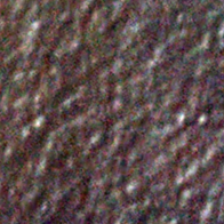

323


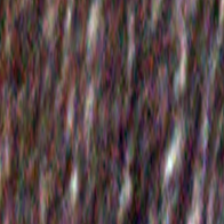

324


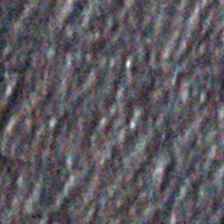

325


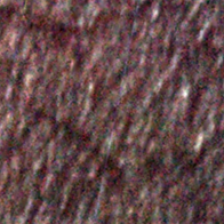

326


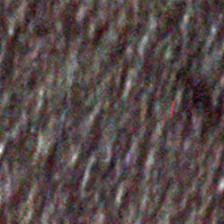

327


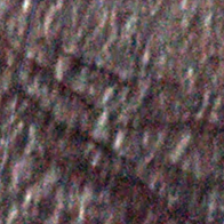

328


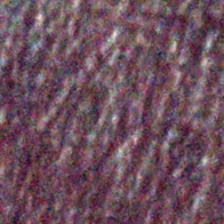

329


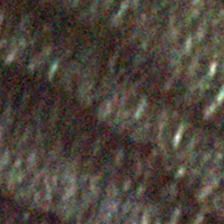

330


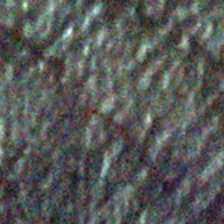

331


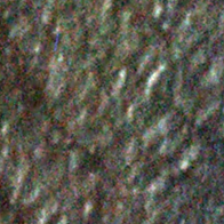

332


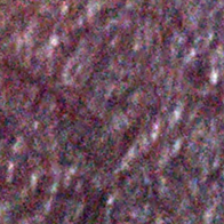

333


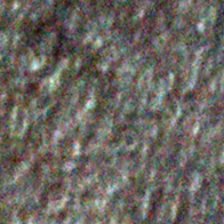

334


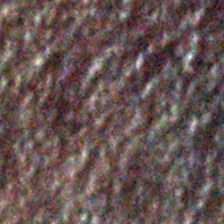

335


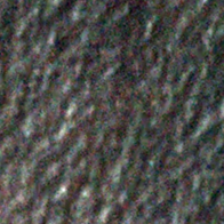

336


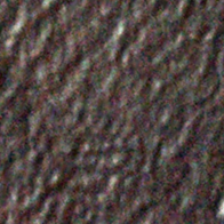

337


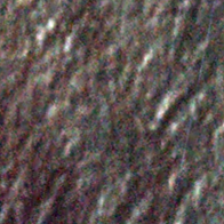

338


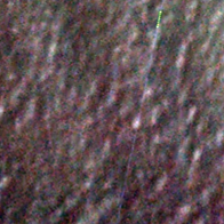

339


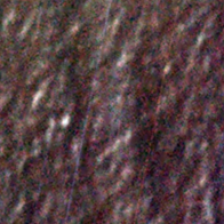

340


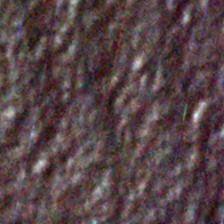

341


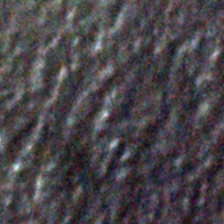

342


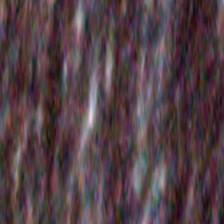

343


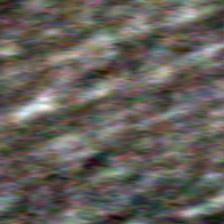

344


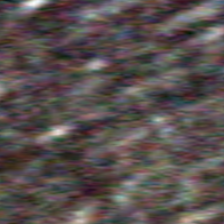

345


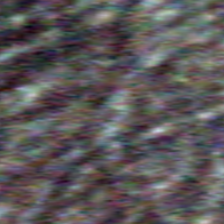

346


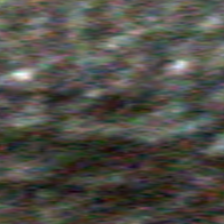

347


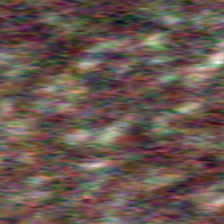

348


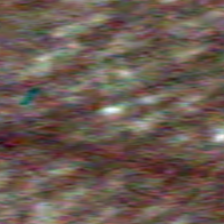

349


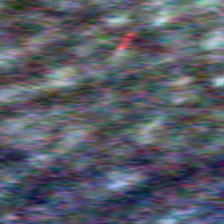

350


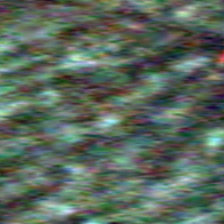

351


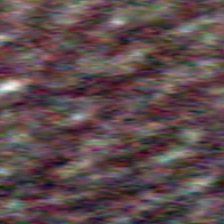

352


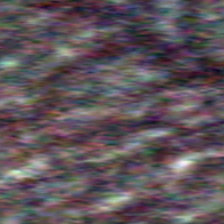

353


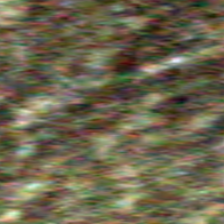

354


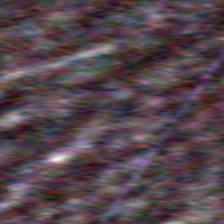

355


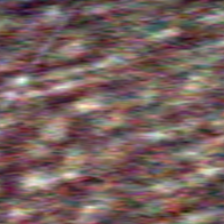

356


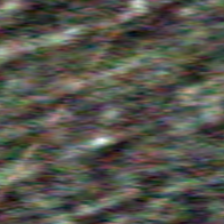

357


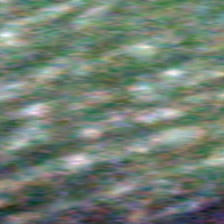

358


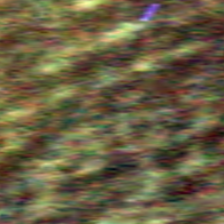

359


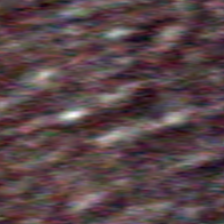

360


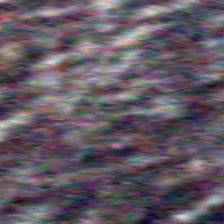

361


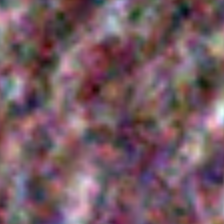

In [9]:
## See raster chunks
i=1
for chunk in raster.chunks(224):
    raster = chunk.raster
    converted_raster = preprocess_raster_image(raster)
    img = tf.image.resize(converted_raster, [256,256])
    img = tf.image.central_crop(img, central_fraction=224/256)
    img = tf.cast(img, np.uint8).numpy()
    img = Image.fromarray(img, 'RGB')
    print(i)
    i=i+1
    img.show()
